In [1]:
import torch
import torchvision
from torchvision import transforms

import numpy as np 
import matplotlib.pyplot as plt
from PIL import Image


In [2]:
from torch.utils.data import Dataset
import numpy as np
import random
import cv2
import h5py

class TrainDataset(Dataset):
    def __init__(self, data_root, target_size=(512, 512), bgr2rgb=True):
        self.hypers = []
        self.bgrs = []
        hyper_data_path = f'{data_root}/Train_spectral/'
        bgr_data_path = f'{data_root}/Train_RGB/'
        with open(f'{data_root}/split_txt/Train_list.txt', 'r') as fin:
            hyper_list = [line.replace('\n', '.mat') for line in fin]
            bgr_list = [line.replace('mat','jpg') for line in hyper_list]
        hyper_list.sort()
        bgr_list.sort()
        print(f'len(hyper_Train) of ntire2022 dataset:{len(hyper_list)}')
        print(f'len(bgr_Train) of ntire2022 dataset:{len(bgr_list)}')
        for i in range(len(hyper_list)):
            hyper_path = hyper_data_path + hyper_list[i]
            if 'mat' not in hyper_path:
                continue
            with h5py.File(hyper_path, 'r') as mat:
                hyper = np.float32(np.array(mat['cube']))
            hyper = np.transpose(hyper, [0, 2, 1])
            bgr_path = bgr_data_path + bgr_list[i]
            assert hyper_list[i].split('.')[0] == bgr_list[i].split('.')[0], 'Hyper and RGB come from different scenes.'
            bgr = cv2.imread(bgr_path)
            if bgr2rgb:
                bgr = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            bgr = np.float32(bgr)
            bgr = (bgr - bgr.min()) / (bgr.max() - bgr.min())
            bgr = np.transpose(bgr, [2, 0, 1])
            self.hypers.append(hyper)
            self.bgrs.append(bgr)
            mat.close()
            print(f'Ntire2022 scene {i} is loaded.')

    def __getitem__(self, idx):
        hyper = self.hypers[idx]
        bgr = self.bgrs[idx]
        target_size = (512,512)
        # Resize both hyper and bgr images to the target size
        hyper = cv2.resize(hyper.transpose(1, 2, 0), target_size).transpose(2, 0, 1)
        bgr = cv2.resize(bgr.transpose(1, 2, 0), target_size).transpose(2, 0, 1)
        
        return np.ascontiguousarray(bgr), np.ascontiguousarray(hyper)

    def __len__(self):
        return len(self.hypers)

class ValidDataset(Dataset):
    def __init__(self, data_root, target_size=(512, 512), bgr2rgb=True):
        self.hypers = []
        self.bgrs = []
        hyper_data_path = f'{data_root}/Valid_spectral/'
        bgr_data_path = f'{data_root}/Valid_RGB/'
        with open(f'{data_root}/split_txt/valid_list.txt', 'r') as fin:
            hyper_list = [line.replace('\n', '.mat') for line in fin]
            bgr_list = [line.replace('mat','jpg') for line in hyper_list]
        hyper_list.sort()
        bgr_list.sort()
        print(f'len(hyper_valid) of ntire2022 dataset:{len(hyper_list)}')
        print(f'len(bgr_valid) of ntire2022 dataset:{len(bgr_list)}')
        for i in range(len(hyper_list)):
            hyper_path = hyper_data_path + hyper_list[i]
            if 'mat' not in hyper_path:
                continue
            with h5py.File(hyper_path, 'r') as mat:
                hyper = np.float32(np.array(mat['cube']))
            hyper = np.transpose(hyper, [0, 2, 1])
            bgr_path = bgr_data_path + bgr_list[i]
            assert hyper_list[i].split('.')[0] == bgr_list[i].split('.')[0], 'Hyper and RGB come from different scenes.'
            bgr = cv2.imread(bgr_path)
            if bgr2rgb:
                bgr = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            bgr = np.float32(bgr)
            bgr = (bgr - bgr.min()) / (bgr.max() - bgr.min())
            bgr = np.transpose(bgr, [2, 0, 1])
            self.hypers.append(hyper)
            self.bgrs.append(bgr)
            mat.close()
            print(f'Ntire2022 scene {i} is loaded.')

    def __getitem__(self, idx):
        hyper = self.hypers[idx]
        bgr = self.bgrs[idx]
#         print(hyper.shape)
        
        target_size = (512,512)
        # Resize both hyper and bgr images to the target size
        hyper = cv2.resize(hyper.transpose(1, 2, 0), target_size).transpose(2, 0, 1)
        bgr = cv2.resize(bgr.transpose(1, 2, 0), target_size).transpose(2, 0, 1)
#         print(hyper.shape)
        return np.ascontiguousarray(bgr), np.ascontiguousarray(hyper)

    def __len__(self):
        return len(self.hypers)

In [ ]:
from torch.utils.data import DataLoader

# Define the dataset path
data_root = "C:/Users/user/Desktop/Research/MST-plus-plus/dataset"

# Create instances of TrainDataset and ValidDataset
train_dataset = TrainDataset(data_root=data_root, bgr2rgb=True)
valid_dataset = ValidDataset(data_root=data_root, bgr2rgb=True)

# Create DataLoader instances for both datasets
train_loader = DataLoader(dataset=train_dataset, batch_size=1, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=1, shuffle=False)

# Load one batch of data from each DataLoader
train_images, train_labels = next(iter(train_loader))
valid_images, valid_labels = next(iter(valid_loader))

# Print the shapes of the loaded data
print("Train Images Shape:", train_images.shape)
print("Train Labels Shape:", train_labels.shape)
print("Valid Images Shape:", valid_images.shape)
print("Valid Labels Shape:", valid_labels.shape)


len(hyper_Train) of ntire2022 dataset:897
len(bgr_Train) of ntire2022 dataset:897
Ntire2022 scene 0 is loaded.
Ntire2022 scene 1 is loaded.
Ntire2022 scene 2 is loaded.
Ntire2022 scene 3 is loaded.
Ntire2022 scene 4 is loaded.
Ntire2022 scene 5 is loaded.
Ntire2022 scene 6 is loaded.
Ntire2022 scene 7 is loaded.
Ntire2022 scene 8 is loaded.
Ntire2022 scene 9 is loaded.
Ntire2022 scene 10 is loaded.
Ntire2022 scene 11 is loaded.
Ntire2022 scene 12 is loaded.
Ntire2022 scene 13 is loaded.
Ntire2022 scene 14 is loaded.
Ntire2022 scene 15 is loaded.
Ntire2022 scene 16 is loaded.
Ntire2022 scene 17 is loaded.
Ntire2022 scene 18 is loaded.
Ntire2022 scene 19 is loaded.
Ntire2022 scene 20 is loaded.
Ntire2022 scene 21 is loaded.
Ntire2022 scene 22 is loaded.
Ntire2022 scene 23 is loaded.
Ntire2022 scene 24 is loaded.
Ntire2022 scene 25 is loaded.
Ntire2022 scene 26 is loaded.
Ntire2022 scene 27 is loaded.
Ntire2022 scene 28 is loaded.
Ntire2022 scene 29 is loaded.
Ntire2022 scene 30 is loaded

Ntire2022 scene 266 is loaded.
Ntire2022 scene 267 is loaded.
Ntire2022 scene 268 is loaded.
Ntire2022 scene 269 is loaded.
Ntire2022 scene 270 is loaded.
Ntire2022 scene 271 is loaded.
Ntire2022 scene 272 is loaded.
Ntire2022 scene 273 is loaded.
Ntire2022 scene 274 is loaded.
Ntire2022 scene 275 is loaded.
Ntire2022 scene 276 is loaded.
Ntire2022 scene 277 is loaded.
Ntire2022 scene 278 is loaded.
Ntire2022 scene 279 is loaded.
Ntire2022 scene 280 is loaded.
Ntire2022 scene 281 is loaded.
Ntire2022 scene 282 is loaded.
Ntire2022 scene 283 is loaded.
Ntire2022 scene 284 is loaded.
Ntire2022 scene 285 is loaded.
Ntire2022 scene 286 is loaded.
Ntire2022 scene 287 is loaded.
Ntire2022 scene 288 is loaded.
Ntire2022 scene 289 is loaded.
Ntire2022 scene 290 is loaded.
Ntire2022 scene 291 is loaded.
Ntire2022 scene 292 is loaded.
Ntire2022 scene 293 is loaded.
Ntire2022 scene 294 is loaded.
Ntire2022 scene 295 is loaded.
Ntire2022 scene 296 is loaded.
Ntire2022 scene 297 is loaded.
Ntire202

In [ ]:
x, y = next(iter(train_loader))

# Find min and max values for 'x' and 'y'
x_min, x_max = torch.min(x), torch.max(x)
y_min, y_max = torch.min(y), torch.max(y)

print(x.shape, y.shape)
# Print the results with labels, rounded to 3 decimal places
print(f"Minimum value of 'x': {x_min:.3f}")
print(f"Maximum value of 'x': {x_max:.3f}")
print(f"Minimum value of 'y': {y_min:.3f}")
print(f"Maximum value of 'y': {y_max:.3f}")

In [ ]:
x, y = next(iter(valid_loader))

# Find min and max values for 'x' and 'y'
x_min, x_max = torch.min(x), torch.max(x)
y_min, y_max = torch.min(y), torch.max(y)

print(x.shape, y.shape)
# Print the results with labels, rounded to 3 decimal places
print(f"Minimum value of 'x': {x_min:.3f}")
print(f"Maximum value of 'x': {x_max:.3f}")
print(f"Minimum value of 'y': {y_min:.3f}")
print(f"Maximum value of 'y': {y_max:.3f}")

## Visualize the data

In [ ]:
import matplotlib.pyplot as plt

sample = train_dataset[164]
# sample = valid_dataset[28]
x, y = sample[0], sample[1]

# Create subplots for the 3-channel input (RGB)
plt.figure(figsize=(12, 4))
for i in range(x.shape[0]):  # Loop through channels
    plt.subplot(1, 3, i + 1)  # Adjust for the number of input channels (3)
    channel_data = x[i]
    plt.imshow(channel_data, cmap='gray')  # Display each channel in grayscale
    plt.title(f'Input Channel {i + 1}')
    plt.axis('off')

# Create subplots for the 31-channel output (Hyperspectral)
plt.figure(figsize=(18, 18))  # Adjust size as needed
for i in range(y.shape[0]):  # Loop through channels
    plt.subplot(6, 6, i + 1)  # Adjust subplot grid for 31 channels
    channel_data = y[i]
    plt.imshow(channel_data, cmap='gray')  # Display each channel in grayscale
    plt.title(f'Output Channel {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Iterate through each channel in the output HSI
for i in range(y.shape[0]):
    plt.figure(figsize=(6, 6))  # Adjust the figure size as needed
    channel_data = y[i]
    
    # Display the channel data
    plt.imshow(channel_data, cmap='gray')
    plt.title(f'Output Channel {i + 1}')
    plt.axis('off')
    
    # Show the plot for the current channel
    plt.show()


## custom SAM LOSS

In [ ]:
import torch
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class SAMLoss(nn.Module):
    def __init__(self):
        super(SAMLoss, self).__init__()

    def forward(self, predicted_hsi, ground_truth_hsi):
        # Ensure the input tensors have the same shape
        assert predicted_hsi.shape == ground_truth_hsi.shape, "Input tensor shapes must match."

        # Reshape tensors if necessary
        if predicted_hsi.dim() == 4:  # If the tensors are 4D, flatten them
            predicted_hsi = predicted_hsi.view(predicted_hsi.size(0), -1)
            ground_truth_hsi = ground_truth_hsi.view(ground_truth_hsi.size(0), -1)

        # Calculate the dot product and magnitudes
        dot_product = torch.sum(predicted_hsi * ground_truth_hsi, dim=1)
        magnitude_pred = torch.norm(predicted_hsi, dim=1)
        magnitude_gt = torch.norm(ground_truth_hsi, dim=1)

        # Calculate the cosine of the spectral angle
        cosine_theta = dot_product / (magnitude_pred * magnitude_gt)

        # Calculate the spectral angle in radians
        spectral_angle = torch.acos(cosine_theta)

        # Return the mean spectral angle as the loss
        return torch.mean(spectral_angle)

#  combined loss
import torch.nn as nn

class CombinedLoss(nn.Module):
    def __init__(self, alpha=0.5, beta=0.5):
        super(CombinedLoss, self).__init__()
        self.alpha = alpha
        self.beta = beta
        self.l1_loss = nn.L1Loss()
        self.sam_loss = SAMLoss()

    def forward(self, outputs, labels):
        loss_l1 = self.l1_loss(outputs, labels)
        loss_sam = self.sam_loss(outputs, labels)
        combined_loss = self.alpha * loss_l1 + self.beta * loss_sam
        return combined_loss


## load the trained model

In [ ]:

# from Architecture.HyperSpectraNet import HyperAttention

# model = HyperAttention(in_channels=3, out_channels=31).to(device).float()


# model.load_state_dict(torch.load('../Models/HyperSpectraNet.pth', map_location=device))
# model.eval() 

In [11]:

from Architecture. import 

model = HyperAttention(in_channels=3, out_channels=31).to(device).float()


model.load_state_dict(torch.load('../Models/HyperSpectraNet.pth', map_location=device))
model.eval() 

HyperAttention(
  (enc1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (en2_spatial_att): SpatialAttention(
    (conv1): Conv2d(128, 1, kernel_size=(1, 1), stride=(1, 1))
    (sigmoid): Sigmoid()
    (batch_norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace

In [12]:
# # from Models_code.Ensemble_FocusNet_multibranch import EnsembleModel, MultiBranchModel , FocusNet
# # from Models_code.Ensemble_haf_3 import EnsembleModel, HyperAttention , SecondModel
# from Models_code.Ensemble_haf_3_fsrcnn import EnsembleModel, SecondModel , HyperAttention

# # from Models_code.Ensemble_FocusNet_HyperAttention import EnsembleModel, HyperAttention , FocusNet
    
# # focusnet_model = FocusNet(in_channels=3, out_channels=31).to(device).float()  # Adjust out_channels to match the target label size
# # first_model = FocusNet(in_channels=3, out_channels=31).to(device).float()
# first_model = HyperAttention(in_channels=3, out_channels=31).to(device).float()
# # Initialize the second model
# # second_model = MultiBranchModel().to(device).float()
# second_model = SecondModel().to(device).float()
# # second_model = HyperAttention(in_channels=34, out_channels=31).to(device).float()

# # Create the ensemble model
# model = EnsembleModel(first_model, second_model).to(device).float()

# model.load_state_dict(torch.load('../Models/best_Ensemble_model.pth', map_location=device))
# model.eval() 

## predict on a single file with the model

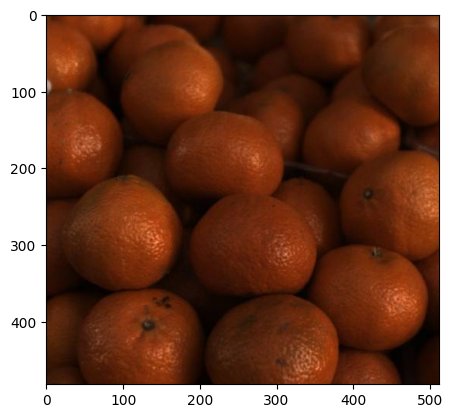

In [13]:
# image_path = "C:/Users/user/Desktop/HSI/dataset/ICASSP2024-SPGC/Hyper-Skin(RGB,VIS)/test/RGB_CIE/p012_neutral_front.jpg"
# image_path = 'C:/Users/user/Desktop/Research/NTIRE_2022/NTIRE_2022/Test_RGB/ARAD_1K_0951.jpg'
# image_path = 'C:/Users/user/Desktop/Research/MST-plus-plus/dataset/Valid_RGB/ARAD_1K_0929.jpg'
image_path = 'C:/Users/user/Desktop/Research/MST-plus-plus/dataset/Train_RGB/ARAD_1K_0165.jpg'
# image_path = "C:/Users/user/Desktop/Research/MST-plus-plus/dataset/Train_RGB/ARAD_1K_0194.jpg"
image = Image.open(image_path)
plt.imshow(image)

In [14]:
image.size

(512, 482)

In [15]:
# Define transformations to convert and preprocess the image
preprocess = transforms.Compose([
#     transforms.Resize((512, 512)),
    transforms.Resize((1024, 1024)),# Resize the image to match your model's input size
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor
])

# Apply the transformations to the image
input_data = preprocess(image)

# Add an extra dimension to match the batch size (1 image in this case)
input_data = input_data.unsqueeze(0)

with torch.no_grad():
    input_data = input_data.to(device)
    output = model(input_data)
    
print('input data max',input_data.max())
print('input data min',input_data.min())
print(output.shape)
print('output max',output.max())
print('output min',output.min())

input data max tensor(0.9922, device='cuda:0')
input data min tensor(0., device='cuda:0')
torch.Size([1, 31, 1024, 1024])
output max tensor(1., device='cuda:0')
output min tensor(0., device='cuda:0')


In [16]:
output

tensor([[[[0.0199, 0.0170, 0.0117,  ..., 0.0205, 0.0173, 0.0186],
          [0.0149, 0.0116, 0.0086,  ..., 0.0158, 0.0130, 0.0147],
          [0.0168, 0.0142, 0.0142,  ..., 0.0147, 0.0178, 0.0193],
          ...,
          [0.0185, 0.0182, 0.0225,  ..., 0.0119, 0.0082, 0.0074],
          [0.0235, 0.0223, 0.0214,  ..., 0.0136, 0.0111, 0.0126],
          [0.0244, 0.0233, 0.0219,  ..., 0.0111, 0.0102, 0.0120]],

         [[0.0177, 0.0145, 0.0100,  ..., 0.0221, 0.0159, 0.0174],
          [0.0117, 0.0057, 0.0062,  ..., 0.0193, 0.0102, 0.0155],
          [0.0165, 0.0136, 0.0134,  ..., 0.0184, 0.0184, 0.0204],
          ...,
          [0.0195, 0.0159, 0.0235,  ..., 0.0114, 0.0076, 0.0085],
          [0.0237, 0.0225, 0.0229,  ..., 0.0128, 0.0093, 0.0115],
          [0.0253, 0.0246, 0.0239,  ..., 0.0089, 0.0083, 0.0106]],

         [[0.0196, 0.0163, 0.0126,  ..., 0.0258, 0.0179, 0.0191],
          [0.0135, 0.0092, 0.0084,  ..., 0.0180, 0.0116, 0.0138],
          [0.0179, 0.0149, 0.0153,  ..., 0

## visualize

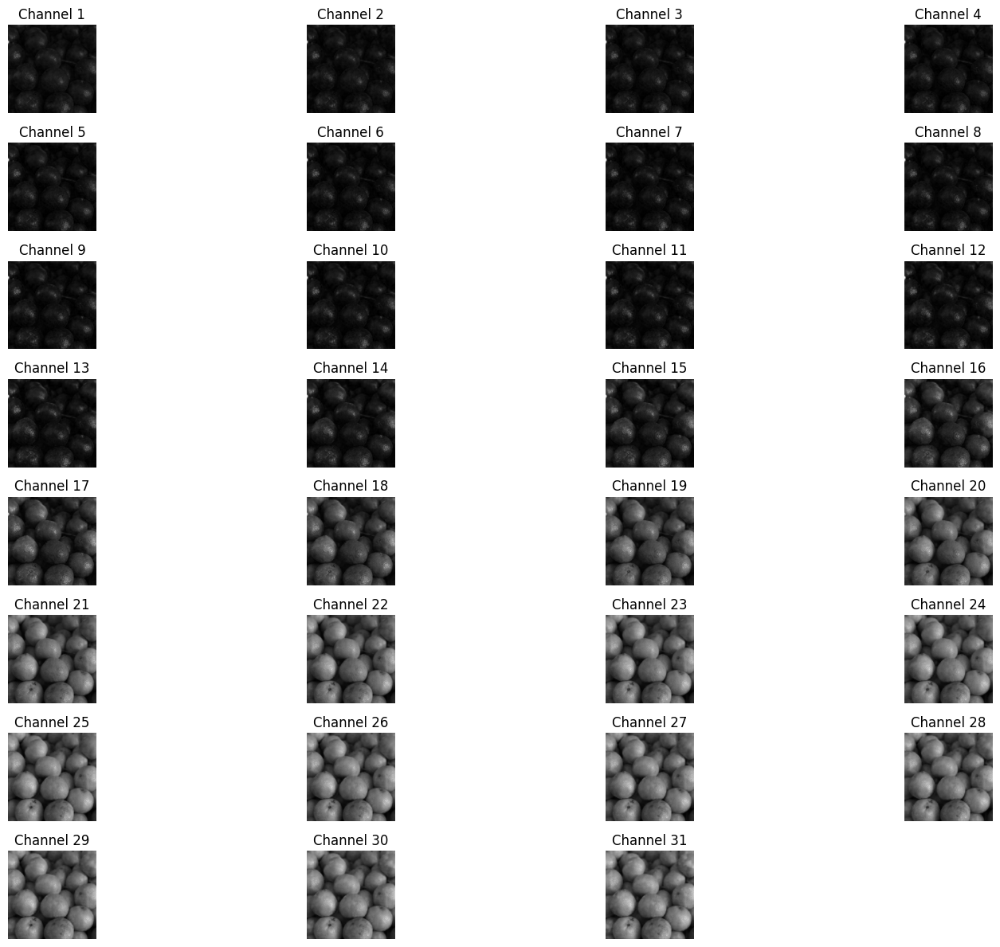

In [17]:
import matplotlib.pyplot as plt

# Assuming 'output' is the result from your model and has shape [1, 31, 482, 512]
# Remove the batch dimension if it exists
if len(output.shape) > 3:
    output = output.squeeze(0)

num_channels = output.shape[0]
num_rows = 8  # You can adjust this based on your preference
num_cols = (num_channels + num_rows - 1) // num_rows  # Calculate the number of columns

plt.figure(figsize=(16, 12))  # Adjust the figure size as needed

for i in range(num_channels):
    plt.subplot(num_rows, num_cols, i + 1)
    channel_data = output[i].cpu().numpy()  # Convert the channel data to a NumPy array
    plt.imshow(channel_data, cmap='gray')  # Display the image in grayscale
    plt.title(f'Channel {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


## bigger visulaization

In [18]:
# import matplotlib.pyplot as plt

# # Assuming 'output' is the result from your model and has shape [1, 31, 482, 512]
# # Remove the batch dimension if it exists
# if len(output.shape) > 3:
#     output = output.squeeze(0)

# num_channels = output.shape[0]

# # Loop through each channel and create a separate figure
# for i in range(num_channels):
#     plt.figure(figsize=(8, 6))  # Adjust the figure size as needed
#     channel_data = output[i].cpu().numpy()  # Convert the channel data to a NumPy array
#     plt.imshow(channel_data, cmap='gray')  # Display the image in grayscale
#     plt.title(f'Channel {i + 1}')
#     plt.axis('off')
#     plt.show()


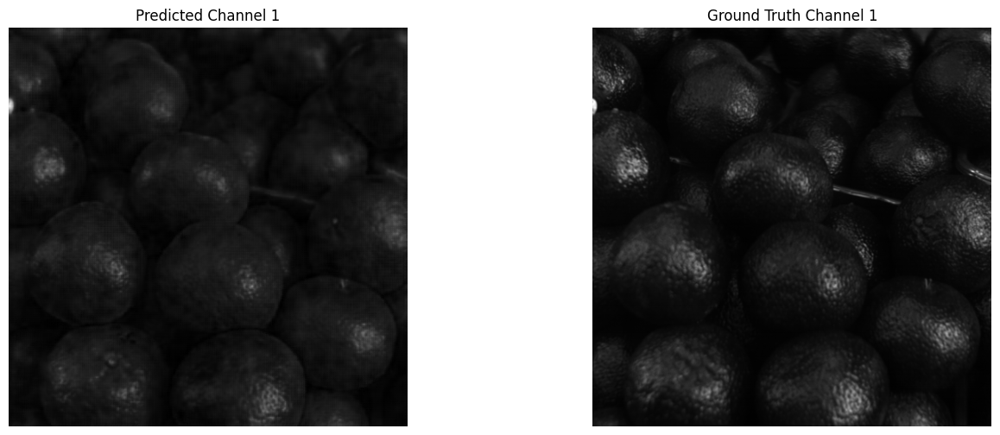

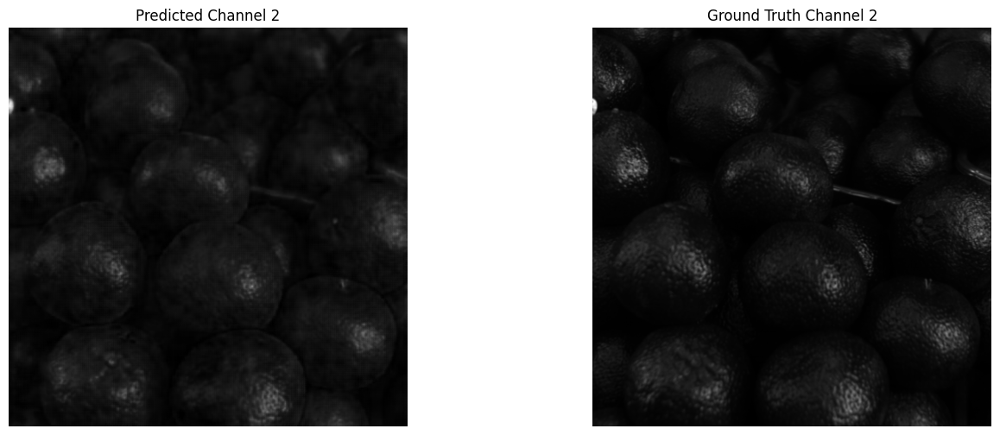

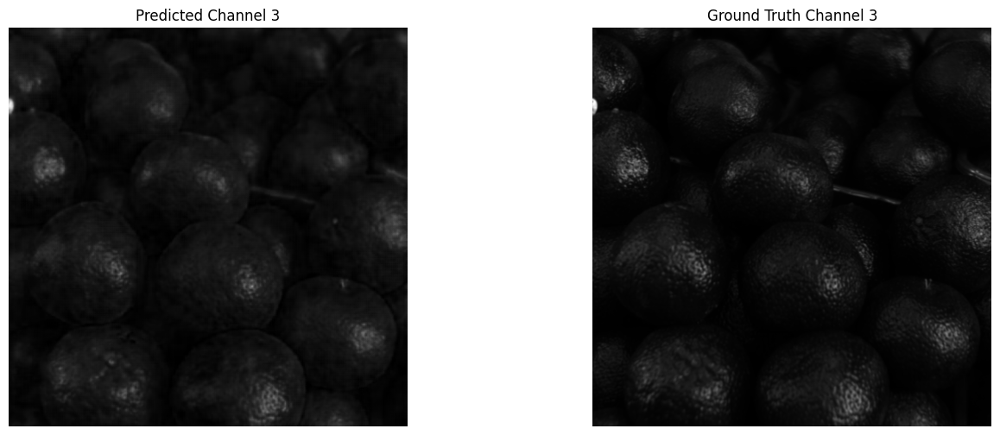

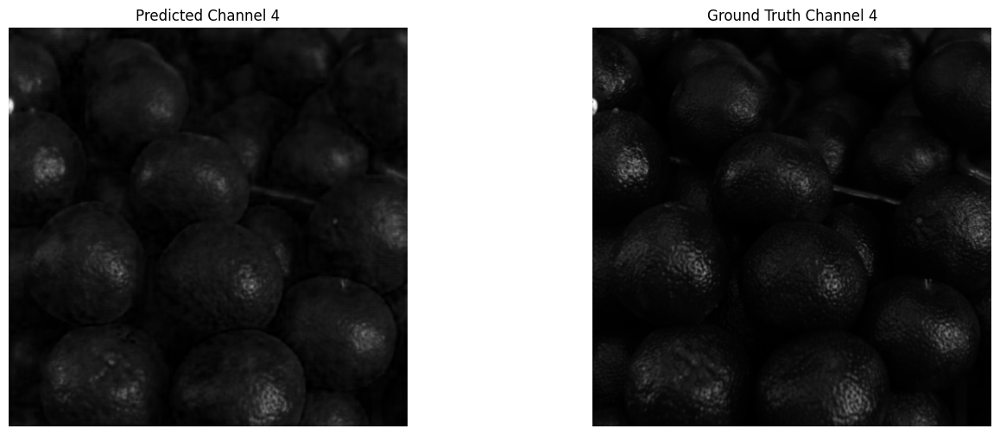

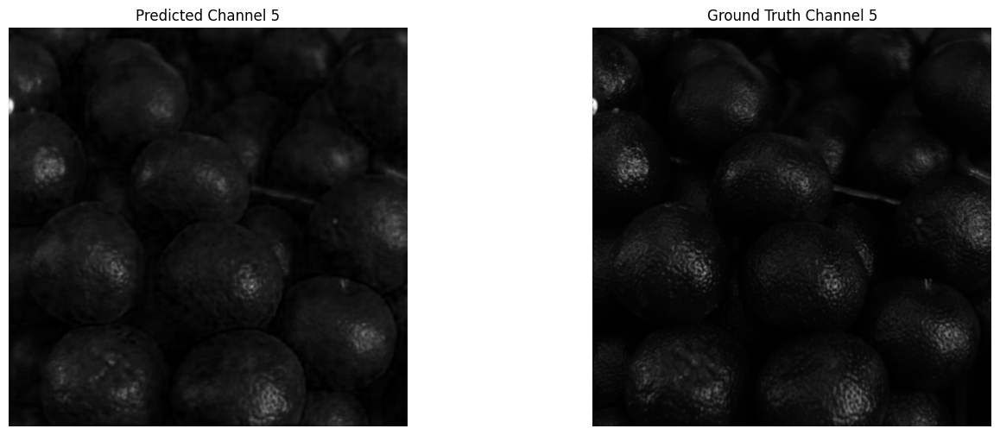

...

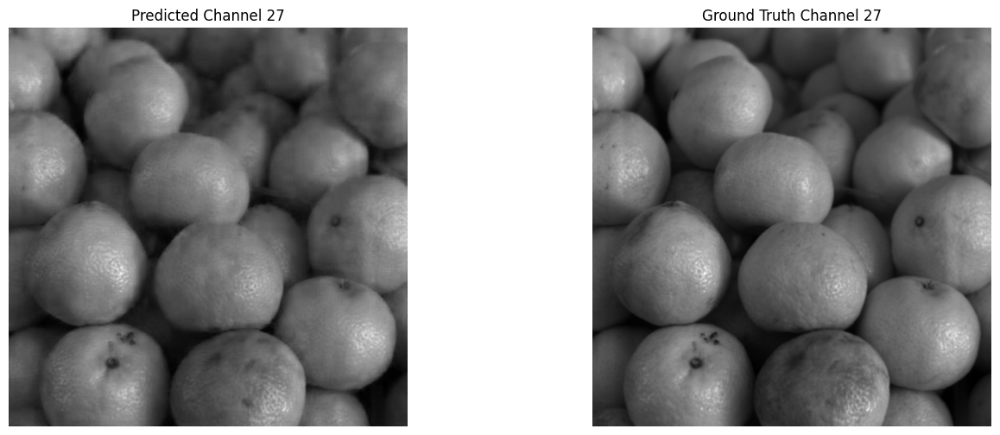

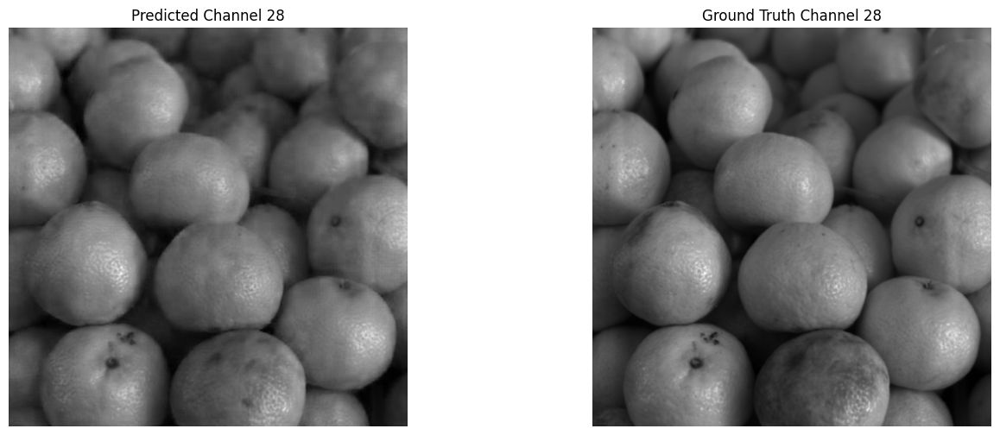

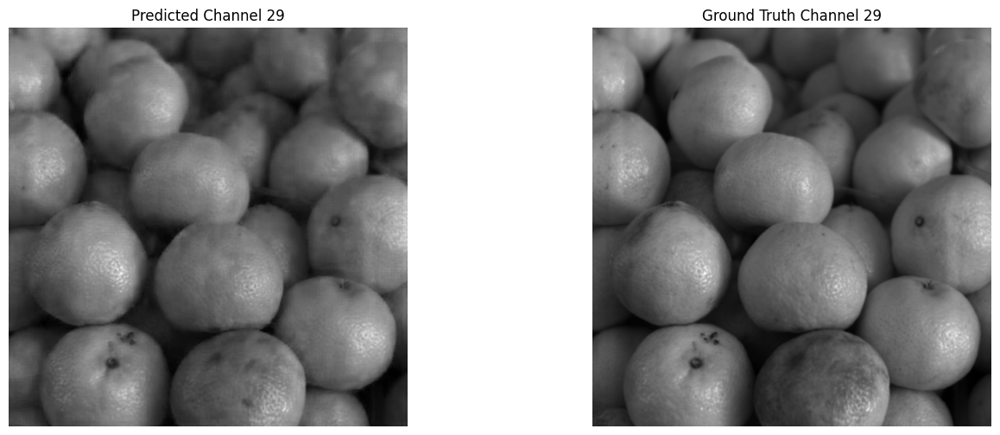

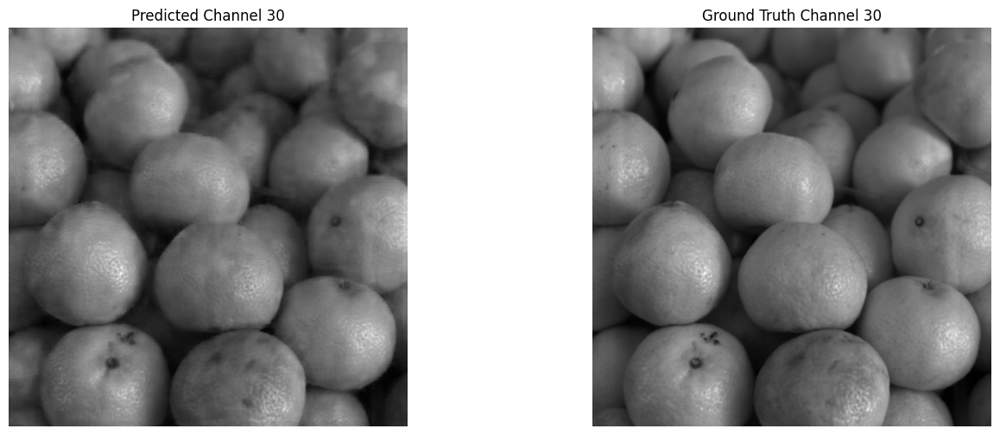

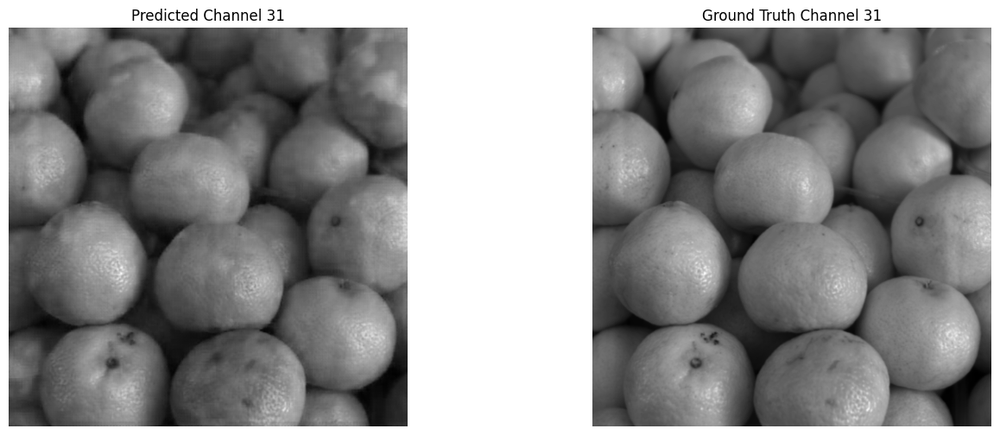

In [19]:
import matplotlib.pyplot as plt

# Assuming 'output' is the model's predicted output with shape [1, 31, 482, 512]
# And 'ground_truth' is the ground truth data with the same shape [1, 31, 482, 512]
# Sample code to get the data
sample = train_dataset[164]
# sample = valid_dataset[28]

x, ground_truth = sample[0], sample[1]

# Remove the batch dimension if it exists in the output tensor
if len(output.shape) > 3:
    output = output.squeeze(0)

num_channels = output.shape[0]

# Loop through each channel and create subplots for predicted and ground truth
for i in range(num_channels):
    plt.figure(figsize=(16, 6))  # Adjust the figure size as needed

    # Display predicted image
    plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
    channel_data_pred = output[i].cpu().numpy()  # Convert to NumPy array
    plt.imshow(channel_data_pred, cmap='gray')  # Display in grayscale
    plt.title(f'Predicted Channel {i + 1}')
    plt.axis('off')

    # Display ground truth image
    plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
    channel_data_gt = ground_truth[i]  # Directly use the NumPy array
    plt.imshow(channel_data_gt, cmap='gray')  # Display in grayscale
    plt.title(f'Ground Truth Channel {i + 1}')
    plt.axis('off')

    plt.show()


## Evaluation

In [20]:
import torch
import math
from piq import ssim
import torch.nn.functional as F

class SAMLoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        super(SAMLoss, self).__init__()
        self.epsilon = epsilon

    def forward(self, predicted_hsi, ground_truth_hsi):
        # Reshape tensors if necessary
        if predicted_hsi.dim() == 4:  # Flatten 4D tensors to 2D
            predicted_hsi = predicted_hsi.view(predicted_hsi.size(0), predicted_hsi.size(1), -1)
            ground_truth_hsi = ground_truth_hsi.view(ground_truth_hsi.size(0), ground_truth_hsi.size(1), -1)

        # Calculate dot product and magnitudes
        dot_product = torch.sum(predicted_hsi * ground_truth_hsi, dim=2)
        magnitude_pred = torch.norm(predicted_hsi, dim=2) + self.epsilon
        magnitude_gt = torch.norm(ground_truth_hsi, dim=2) + self.epsilon

        # Calculate cosine of spectral angle and ensure it's within [-1 + epsilon, 1 - epsilon]
        cosine_theta = torch.clamp(dot_product / (magnitude_pred * magnitude_gt), -1 + self.epsilon, 1 - self.epsilon)

        # Calculate spectral angle in radians
        spectral_angle = torch.acos(cosine_theta)

        return torch.mean(spectral_angle)

criterion = SAMLoss()

def mrae_loss(outputs, targets):
    epsilon = 1e-8  # To avoid division by zero
    relative_error = torch.abs((outputs - targets) / (targets + epsilon))
    mrae = torch.mean(relative_error)
    return mrae

def l1_loss(outputs, targets):
    return F.l1_loss(outputs, targets, reduction='mean')

# Define the RMSE Loss Function
def rmse_loss(outputs, targets):
    mse = torch.mean((outputs - targets) ** 2)
    rmse = torch.sqrt(mse)
    return rmse

# Define the PSNR Loss Function
def psnr_loss(outputs, targets, max_pixel=1.0):  # Assuming normalized data [0, 1]
    mse = torch.mean((outputs - targets) ** 2)
    if mse == 0:
        return float('inf')
    psnr = 20 * math.log10(max_pixel) - 10 * math.log10(mse)
    return psnr

# Assuming the model is already in evaluation mode and loaded
model.eval()

# Initialize variables to store total losses
total_sam_loss = 0.0
total_ssim = 0.0
total_rmse = 0.0
total_psnr = 0.0
total_l1_loss = 0.0  # Initialize total L1 Loss
total_mrae = 0.0

with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()

        # Forward pass
        outputs_val = model(x_val)

        # Ensure output size matches target size
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=y_val.shape[2:], mode='bilinear', align_corners=False)

        # Min-max normalization for outputs and targets
        outputs_val_norm = (outputs_val - outputs_val.min()) / (outputs_val.max() - outputs_val.min() + 1e-8)
        y_val_norm = (y_val - y_val.min()) / (y_val.max() - y_val.min() + 1e-8)
#         print(outputs_val_norm.min(), outputs_val_norm.max())

        # Calculate losses
        sam_loss = criterion(outputs_val_norm, y_val_norm)
        ssim_val = ssim(outputs_val_norm, y_val_norm, data_range=1.0)
        rmse_val = rmse_loss(outputs_val_norm, y_val_norm)
        psnr_val = psnr_loss(outputs_val_norm, y_val_norm)
        l1_val = l1_loss(outputs_val_norm, y_val_norm)  # Calculate L1 Loss
        mrae_val = mrae_loss(outputs_val_norm, y_val_norm)

        # Accumulate the total losses
        total_sam_loss += sam_loss.item()
        total_ssim += ssim_val.item()
        total_rmse += rmse_val.item()
        total_psnr += psnr_val
        total_l1_loss += l1_val.item()
        total_mrae += mrae_val.item()

# Calculate the average losses over all batches
avg_sam_loss = total_sam_loss / len(valid_loader)
avg_ssim = total_ssim / len(valid_loader)
avg_rmse = total_rmse / len(valid_loader)
avg_psnr = total_psnr / len(valid_loader)
avg_l1_loss = total_l1_loss / len(valid_loader) 
avg_mrae = total_mrae / len(valid_loader)

# Print the average losses

# Print the average losses along with the model's name
model_name = type(model).__name__
print(f"Model Name: {model_name}")
print(f"Average L1 Loss: {avg_l1_loss:.4f}")
print(f"Average SAM Loss: {avg_sam_loss:.4f}")
print(f"Average MRAE: {avg_mrae:.4f}")
print(f"Average SSIM: {avg_ssim:.4f}")
print(f"Average RMSE: {avg_rmse:.4f}")
print(f"Average PSNR: {avg_psnr:.4f}")

Model Name: HyperAttention
Average L1 Loss: 0.0206
Average SAM Loss: 0.0987
Average MRAE: 0.3722
Average SSIM: 0.9442
Average RMSE: 0.0324
Average PSNR: 31.6000


## specific channel evaluation

In [74]:
# Assuming the model is already in evaluation mode and loaded
model.eval()

# Initialize variables to store total losses
total_sam_loss = 0.0
total_ssim = 0.0
total_rmse = 0.0
total_psnr = 0.0
total_l1_loss = 0.0
total_mrae = 0.0

# Range of channels to evaluate on (5 to 30)
channel_start, channel_end = 5, 25

with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()

        # Forward pass
        outputs_val = model(x_val)

        # Ensure output size matches target size
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=y_val.shape[2:], mode='bilinear', align_corners=False)

        # Select specific range of channels
        outputs_val_selected = outputs_val[:, channel_start:channel_end]
        y_val_selected = y_val[:, channel_start:channel_end]

        # Min-max normalization for outputs and targets
        outputs_val_norm = (outputs_val_selected - outputs_val_selected.min()) / (outputs_val_selected.max() - outputs_val_selected.min() + 1e-8)
        y_val_norm = (y_val_selected - y_val_selected.min()) / (y_val_selected.max() - y_val_selected.min() + 1e-8)

        # Calculate losses for the selected channels
        sam_loss = criterion(outputs_val_norm, y_val_norm)
        ssim_val = ssim(outputs_val_norm, y_val_norm, data_range=1.0)
        rmse_val = rmse_loss(outputs_val_norm, y_val_norm)
        psnr_val = psnr_loss(outputs_val_norm, y_val_norm)
        l1_val = l1_loss(outputs_val_norm, y_val_norm)
        mrae_val = mrae_loss(outputs_val_norm, y_val_norm)

        # Accumulate the total losses
        total_sam_loss += sam_loss.item()
        total_ssim += ssim_val.item()
        total_rmse += rmse_val.item()
        total_psnr += psnr_val
        total_l1_loss += l1_val.item()
        total_mrae += mrae_val.item()

# Calculate the average losses over all batches
avg_sam_loss = total_sam_loss / len(valid_loader)
avg_ssim = total_ssim / len(valid_loader)
avg_rmse = total_rmse / len(valid_loader)
avg_psnr = total_psnr / len(valid_loader)
avg_l1_loss = total_l1_loss / len(valid_loader) 
avg_mrae = total_mrae / len(valid_loader)

# Print the average losses
model_name = type(model).__name__
print(f"Model Name: {model_name}")
print(f"Average L1 Loss (Channels 5-30): {avg_l1_loss:.4f}")
print(f"Average SAM Loss (Channels 5-30): {avg_sam_loss:.4f}")
print(f"Average MRAE (Channels 5-30): {avg_mrae:.4f}")
print(f"Average SSIM (Channels 5-30): {avg_ssim:.4f}")
print(f"Average RMSE (Channels 5-30): {avg_rmse:.4f}")
print(f"Average PSNR (Channels 5-30): {avg_psnr:.4f}")


Model Name: HyperAttention
Average L1 Loss (Channels 5-30): 0.0176
Average SAM Loss (Channels 5-30): 0.0820
Average MRAE (Channels 5-30): 0.3417
Average SSIM (Channels 5-30): 0.9605
Average RMSE (Channels 5-30): 0.0288
Average PSNR (Channels 5-30): 32.6970


## train evals calculation

In [ ]:
# Assuming the model is already in evaluation mode and loaded
model.eval()

# Initialize variables to store total losses for training dataset
total_sam_loss_train = 0.0
total_ssim_train = 0.0
total_rmse_train = 0.0
total_psnr_train = 0.0
total_l1_loss_train = 0.0
total_mrae_train = 0.0

with torch.no_grad():
    for batch_idx, (x_train, y_train) in enumerate(train_loader):
        x_train, y_train = x_train.to(device).float(), y_train.to(device).float()

        # Forward pass
        outputs_train = model(x_train)

        # Ensure output size matches target size
        outputs_train = torch.nn.functional.interpolate(outputs_train, size=y_train.shape[2:], mode='bilinear', align_corners=False)

        # Min-max normalization for outputs and targets
        outputs_train_norm = (outputs_train - outputs_train.min()) / (outputs_train.max() - outputs_train.min() + 1e-8)
        y_train_norm = (y_train - y_train.min()) / (y_train.max() - y_train.min() + 1e-8)

        # Calculate losses
        sam_loss_train = criterion(outputs_train_norm, y_train_norm)
        ssim_train = ssim(outputs_train_norm, y_train_norm, data_range=1.0)
        rmse_train = rmse_loss(outputs_train_norm, y_train_norm)
        psnr_train = psnr_loss(outputs_train_norm, y_train_norm)
        l1_train = l1_loss(outputs_train_norm, y_train_norm)
        mrae_train = mrae_loss(outputs_train_norm, y_train_norm)

        # Accumulate the total losses
        total_sam_loss_train += sam_loss_train.item()
        total_ssim_train += ssim_train.item()
        total_rmse_train += rmse_train.item()
        total_psnr_train += psnr_train
        total_l1_loss_train += l1_train.item()
        total_mrae_train += mrae_train.item()

# Calculate the average losses over all training batches
avg_sam_loss_train = total_sam_loss_train / len(train_loader)
avg_ssim_train = total_ssim_train / len(train_loader)
avg_rmse_train = total_rmse_train / len(train_loader)
avg_psnr_train = total_psnr_train / len(train_loader)
avg_l1_loss_train = total_l1_loss_train / len(train_loader)
avg_mrae_train = total_mrae_train / len(train_loader)

# Print the average losses for training dataset
print(f"Training Average L1 Loss: {avg_l1_loss_train:.4f}")
print(f"Training Average SAM Loss: {avg_sam_loss_train:.4f}")
print(f"Training Average MRAE: {avg_mrae_train:.4f}")
print(f"Training Average SSIM: {avg_ssim_train:.4f}")
print(f"Training Average RMSE: {avg_rmse_train:.4f}")
print(f"Training Average PSNR: {avg_psnr_train:.4f}")


## val sam

In [47]:
# Assuming model is already loaded and in evaluation mode
model.eval()
criterion = SAMLoss()

# Define a variable to store the total loss
total_val_loss = 0.0

# Iterate over the validation loader
with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()

        # Forward pass
        outputs_val = model(x_val)
        
        # You may need to apply the same interpolation to outputs_val as in the training loop
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=(512, 512), mode='bilinear', align_corners=False)

        # Calculate the loss
        val_loss = criterion(outputs_val, y_val)

        # Accumulate the total loss
        total_val_loss += val_loss.item()

# Calculate the average validation loss
avg_val_loss = total_val_loss / len(valid_loader)

# Print or use the average validation loss as needed
print(f"Average Validation Loss: {avg_val_loss:.4f}")


Average Validation Loss: 0.1035


## rmse

In [ ]:
import torch

# Define the RMSE Loss Function
def rmse_loss(outputs, targets):
    mse = torch.mean((outputs - targets) ** 2)
    rmse = torch.sqrt(mse)
    return rmse

# Function for min-max normalization
def min_max_normalize(tensor):
    min_val = tensor.min()
    max_val = tensor.max()
    normalized = (tensor - min_val) / (max_val - min_val)
    return normalized

# Assuming the model is already in evaluation mode and loaded
model.eval()

# Variable to store the total RMSE
total_rmse = 0.0
with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()
#         print('x_val max',x_val.max())

        # Forward pass
        outputs_val = model(x_val)

        # Resize outputs
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=(512, 512), mode='bilinear', align_corners=False)

        # Normalize the outputs
        outputs_val = min_max_normalize(outputs_val)

        # Check shapes and a few sample values
#         print(f"Batch: {batch_idx}")
#         print(f"Outputs Shape: {outputs_val.shape}, Targets Shape: {y_val.shape}")
#         print(f"Sample Outputs: {outputs_val[0, 0, :5, :5]}")
#         print(f"Sample Targets: {y_val[0, 0, :5, :5]}")

        # Calculate RMSE
        batch_rmse = rmse_loss(outputs_val, y_val)
        total_rmse += batch_rmse.item()
#         print(f"Batch RMSE: {batch_rmse.item()}\n")

# Calculate average RMSE
avg_rmse = total_rmse / len(valid_loader)
print(f"Average RMSE: {avg_rmse}")


## psnr

In [ ]:
import torch
import math

def psnr_loss(outputs, targets, max_pixel=255.0):
    mse = torch.mean((outputs - targets) ** 2)
    if mse == 0:
        return float('inf')
    psnr = 20 * math.log10(max_pixel) - 10 * math.log10(mse)
    return psnr

model.eval()
total_psnr = 0.0

with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()
#         print(y_val.max(), y_val.min())
        
        outputs_val = model(x_val)
#         print('output',outputs_val.max(), outputs_val.min())
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=y_val.shape[2:], mode='bilinear', align_corners=False)

        # Adjust max_pixel if your images are normalized or in a different scale
        max_pixel_val = 1.0 if y_val.max() <= 1.0 else 255.0
        batch_psnr = psnr_loss(outputs_val, y_val, max_pixel=max_pixel_val)
        total_psnr += batch_psnr

avg_psnr = total_psnr / len(valid_loader)
print(f"Average PSNR on Validation Set: {avg_psnr:.4f}")


## ssim

In [99]:
import torch
from piq import ssim

# Assuming the model is already in evaluation mode and loaded
model.eval()

# Variable to store the total SSIM
total_ssim = 0.0

with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()

        # Forward pass to get the outputs
        outputs_val = model(x_val)

        # Resize the outputs to match the target dimensions if necessary
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=(512, 512), mode='bilinear', align_corners=False)

        # Clip the outputs and targets to be in the range [0, 1]
        outputs_val = torch.clamp(outputs_val, 0, 1)
        y_val = torch.clamp(y_val, 0, 1)

        # Calculate SSIM for the current batch
        batch_ssim = ssim(outputs_val, y_val, data_range=1.0)

        # Accumulate total SSIM
        total_ssim += batch_ssim.item()

# Calculate the average SSIM over all batches
avg_ssim = total_ssim / len(valid_loader)

# Print or use the average SSIM as needed
print(f"Average SSIM on Validation Set: {avg_ssim:.4f}")


Average SSIM on Validation Set: 0.1616


In [100]:
import torch

# Define the MRAE Loss Function
def mrae_loss(outputs, targets):
    # Avoid division by zero
    targets = torch.where(targets == 0, torch.full_like(targets, 1e-8), targets)
    mrae = torch.mean(torch.abs((outputs - targets) / targets))
    return mrae

# Assuming the model is already in evaluation mode and loaded
model.eval()

# Variable to store the total MRAE
total_mrae = 0.0
with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()

        # Forward pass
        outputs_val = model(x_val)

        # Resize outputs if necessary
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=(512, 512), mode='bilinear', align_corners=False)

        # Calculate MRAE
        batch_mrae = mrae_loss(outputs_val, y_val)
        total_mrae += batch_mrae.item()

# Calculate average MRAE
avg_mrae = total_mrae / len(valid_loader)
print(f"Average MRAE: {avg_mrae:.4f}")


Average MRAE: 8034.3213


## train sam loss

In [58]:
# Assuming model is already loaded and in evaluation mode
model.eval()
criterion = SAMLoss()
# Define a variable to store the total loss
total_train_loss = 0.0

# Iterate over the training loader
with torch.no_grad():
    for batch_idx, (x_train, y_train) in enumerate(train_loader):  # Use train_loader instead of val_loader
        x_train, y_train = x_train.to(device).float(), y_train.to(device).float()

        # Forward pass
        outputs_train = model(x_train)
        
        # You may need to apply the same interpolation to outputs_train as in the training loop
        outputs_train = torch.nn.functional.interpolate(outputs_train,size=(512, 512), mode='bilinear', align_corners=False)

        # Calculate the loss
        train_loss = criterion(outputs_train, y_train)

        # Accumulate the total loss
        total_train_loss += train_loss.item()

# Calculate the average training loss
avg_train_loss = total_train_loss / len(train_loader)

# Print or use the average training loss as needed
print(f"Average Training Loss: {avg_train_loss:.4f}")


Average Training Loss: 0.0859


## train evals

In [59]:
# Assuming the model is in evaluation mode and loaded
model.eval()

# Initialize variables to store total losses for training data
total_sam_loss_train = 0.0
total_ssim_train = 0.0
total_rmse_train = 0.0
total_psnr_train = 0.0

with torch.no_grad():
    for batch_idx, (x_train, y_train) in enumerate(train_loader):
        x_train, y_train = x_train.to(device).float(), y_train.to(device).float()

        # Forward pass
        outputs_train = model(x_train)

        # Ensure output size matches target size
        outputs_train = torch.nn.functional.interpolate(outputs_train, size=y_train.shape[2:], mode='bilinear', align_corners=False)

        # Min-max normalization for outputs and targets
        outputs_train_norm = (outputs_train - outputs_train.min()) / (outputs_train.max() - outputs_train.min() + 1e-8)
        y_train_norm = (y_train - y_train.min()) / (y_train.max() - y_train.min() + 1e-8)

        # Calculate losses
        sam_loss_train = criterion(outputs_train_norm, y_train_norm)
        ssim_train = ssim(outputs_train_norm, y_train_norm, data_range=1.0)
        rmse_train = rmse_loss(outputs_train_norm, y_train_norm)
        psnr_train = psnr_loss(outputs_train_norm, y_train_norm)

        # Accumulate the total losses for training data
        total_sam_loss_train += sam_loss_train.item()
        total_ssim_train += ssim_train.item()
        total_rmse_train += rmse_train.item()
        total_psnr_train += psnr_train

# Calculate the average losses over all training batches
avg_sam_loss_train = total_sam_loss_train / len(train_loader)
avg_ssim_train = total_ssim_train / len(train_loader)
avg_rmse_train = total_rmse_train / len(train_loader)
avg_psnr_train = total_psnr_train / len(train_loader)

# Print the average losses for training data
print(f"Average SAM Loss on Training Data: {avg_sam_loss_train:.4f}")
print(f"Average SSIM on Training Data: {avg_ssim_train:.4f}")
print(f"Average RMSE on Training Data: {avg_rmse_train:.4f}")
print(f"Average PSNR on Training Data: {avg_psnr_train:.4f}")


Average SAM Loss on Training Data: 0.1348
Average SSIM on Training Data: 0.8732
Average RMSE on Training Data: 0.0310
Average PSNR on Training Data: 79.7411
